## I. Przygotowanie

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as Functional
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms

In [2]:
torch.cuda.set_device(0)
device = torch.device("cuda")
torch.cuda.is_available()

True

In [3]:
if torch.cuda.is_available():
    torch.cuda.manual_seed(500)
    torch.cuda.manual_seed_all(500)

torch.manual_seed(500)

torch.backends.cudnn.determinstic = True
torch.backends.cudnn.benchmark = False

## Przygotowanie danych

+ Odpowiednia normalizacja próbek (wraz z rozkładem na ich podstawie).

In [4]:
def count_dataset_stats(inp_dataset: torchvision.datasets.ImageFolder, n_channels: int = 3, batch_size: int=32) -> tuple[
    list, list]:
    """
    Function counts mean and standard deviation for each channel in dataset
    :param inp_dataset: dataset to count stats on
    :param n_channels: number of channels in dataset
    :param batch_size: size of batch in calculations
    :return:
        means - list of means for each channel
        stds - list of standard deviations for each channel
    """
    inp_dataloader = torch.utils.data.DataLoader(inp_dataset, batch_size=batch_size, shuffle=False)
    sums_sq = [0.0, 0.0, 0.0]
    stds = [0.0, 0.0, 0.0]
    means = [0.0, 0.0, 0.0]
    counts = [0.0, 0.0, 0.0]
    sums = [0.0, 0.0, 0.0]
    for index, data in enumerate(inp_dataloader):
        data_img = data[0]
        for ch_ind in range(n_channels):
            data_img_ch = data_img[:, ch_ind]
            counts[ch_ind] += np.prod(data_img_ch.shape)
            sums[ch_ind] += data_img_ch.sum()
    for ch_ind in range(n_channels):
        means[ch_ind] = sums[ch_ind] / counts[ch_ind]
    for index, data in enumerate(inp_dataloader):
        data_img = data[0]
        for ch_ind in range(n_channels):
            data_img_ch = data_img[:, ch_ind]
            sums_sq[ch_ind] += ((data_img_ch - means[ch_ind])**2).sum()
    for ch_ind in range(n_channels):
        stds[ch_ind] = np.sqrt(sums_sq[ch_ind] / counts[ch_ind]).item()
        means[ch_ind] = means[ch_ind].item()
    return (means, stds)

In [5]:
dataset_not_normalized = torchvision.datasets.ImageFolder("data/", transform=transforms.ToTensor())

In [6]:
mean_dataset, stdd_dataset = count_dataset_stats(dataset_not_normalized)
print(mean_dataset, stdd_dataset)

[0.31852805614471436, 0.29300791025161743, 0.30163708329200745] [0.2762238681316376, 0.26541516184806824, 0.26857253909111023]


In [7]:
transform = transforms.Compose(
    [transforms.ToTensor(),
     transforms.Normalize(mean_dataset, stdd_dataset)]
)

In [8]:
train_dataset = torchvision.datasets.ImageFolder("data/", transform=transform)

In [9]:
BATCH_SIZE = 128
train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle = True)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([ 2, 27,  9, 26,  8, 20, 10,  5,  1, 30, 11,  7, 13, 38, 38, 40, 29, 11,
         1, 18, 20,  9, 13, 13, 13, 25, 17, 38, 15,  3,  2, 31,  4,  3, 37,  1,
         2, 13,  6, 29,  9, 13,  5, 18, 31,  1, 11, 13, 17,  7, 12,  3, 13, 12,
         1, 10,  5, 11,  1, 33,  9,  7, 26, 38,  7, 38, 31, 33,  5, 10,  9,  9,
        29,  5, 38, 38,  5, 29, 10, 28, 40, 11,  9, 18, 14, 42, 38,  2,  3, 15,
         8, 12,  8, 38,  4,  8,  1,  4,  7,  6,  9, 38,  8, 26,  8, 13, 27, 18,
        18, 10,  8, 12,  4, 17, 13,  7,  4, 35, 10, 12,  7,  9,  9, 25, 35,  8,
        25,  4])


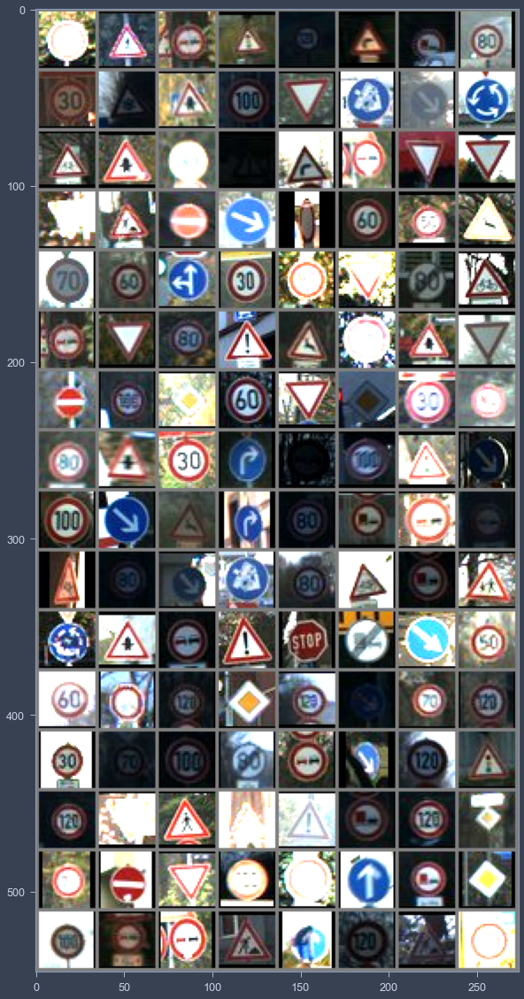

In [10]:
plt.figure(figsize=(10, 20))

def imshow(img):
    img = img / 2 + 0.5
    np_img = img.numpy()
    plt.imshow(np.transpose(np_img, (1, 2, 0)))
    plt.show()

dataiter = iter(train_loader)
images, labels = dataiter.next()
print(labels)
imshow(torchvision.utils.make_grid(images))

## 3. Model - CondGAN

In [11]:
numb_classess = len(train_dataset.classes)
numb_classess

43

In [145]:
class CondSignsDiscriminator(nn.Module):
    def __init__(self):
        super().__init__()
        self.class_layer_1 = nn.Linear(numb_classess, int(numb_classess/2))
        self.class_layer_2 = nn.Linear(int(numb_classess/2), int(numb_classess/3))
        self.class_leakyrelu = nn.LeakyReLU(0.2)

        self.conv_1 = nn.Conv2d(in_channels=3, out_channels=128, kernel_size=(3,3))
        self.bn_1 = nn.BatchNorm2d(128)
        self.conv_leakyrelu_1 = nn.LeakyReLU(0.2)

        self.conv_2 = nn.Conv2d(in_channels=128, out_channels=128, kernel_size=(4,4), stride=(2,2))
        self.bn_2 = nn.BatchNorm2d(128)
        self.conv_leakyrelu_2 = nn.LeakyReLU(0.2)

        self.conv_3 = nn.Conv2d(in_channels=128, out_channels=128, kernel_size=(4,4), stride=(2,2))
        self.bn_3 = nn.BatchNorm2d(128)
        self.conv_leakyrelu_3 = nn.LeakyReLU(0.2)

        self.conv_4 = nn.Conv2d(in_channels=128, out_channels=128, kernel_size=(4,4), stride=(2,2))
        self.bn_4 = nn.BatchNorm2d(128)
        self.conv_leakyrelu_4 = nn.LeakyReLU(0.2)

        # 512 = 128 * 2x2

        self.dense_1 = nn.Linear(2*2*128 + int(numb_classess/3), 400)
        self.dense_2 = nn.Linear(400, 50)
        self.out_layer = nn.Linear(50, 1)

        self.dense_leakyrelu_1 = nn.LeakyReLU(0.2)
        self.dense_leakyrelu_2 = nn.LeakyReLU(0.2)



    def forward(self, img_inp, class_info):
        cl_info = self.class_layer_1(class_info)
        cl_info = self.class_leakyrelu(cl_info)
        cl_info = self.class_layer_2(cl_info)

        img = self.bn_1(self.conv_leakyrelu_1(self.conv_1(img_inp)))
        img = self.bn_2(self.conv_leakyrelu_2(self.conv_2(img)))
        img = self.bn_3(self.conv_leakyrelu_3(self.conv_3(img)))
        img = self.bn_4(self.conv_leakyrelu_4(self.conv_4(img)))

        img = torch.flatten(img, 1)
        fc_inp = torch.cat([img, cl_info], 1)
        fc_inp = self.dense_leakyrelu_1(self.dense_1(fc_inp))
        fc_inp = self.dense_leakyrelu_2(self.dense_2(fc_inp))
        fc_inp = self.out_layer(fc_inp)

        return fc_inp

In [146]:
class CondSignsGenerator(nn.Module):
    def __init__(self, latent_dim=128):
        super().__init__()
        self.dense_1 = nn.Linear(latent_dim + numb_classess, 128*16)
        self.dense_leakyrelu_1 = nn.LeakyReLU(0.2)

        self.dense_2 = nn.Linear(128*16, 128*16*16)
        self.dense_leakyrelu_2 = nn.LeakyReLU(0.2)

        self.conv_1 = nn.Conv2d(in_channels=128, out_channels=128, kernel_size=(5,5), stride=(1,1), padding=(2,2))
        self.conv_leakyrelu_1 = nn.LeakyReLU(0.2)
        self.conv_bn_1 = nn.BatchNorm2d(128)

        self.conv_transpose_1 = nn.ConvTranspose2d(in_channels=128, out_channels=128, kernel_size=(4,4), stride=(2,2), padding=(1,1))
        self.conv_bn_transpose_1 = nn.BatchNorm2d(128)

        # 32 x 32 x 128

        self.conv_2 = nn.Conv2d(in_channels=128, out_channels=64, kernel_size=(5,5), stride=(1,1), padding=(2,2))
        self.conv_leakyrelu_2 = nn.LeakyReLU(0.2)
        self.conv_bn_2 = nn.BatchNorm2d(64)

        self.conv_3 = nn.Conv2d(in_channels=64, out_channels=32, kernel_size=(5,5), stride=(1,1), padding=(2,2))
        self.conv_leakyrelu_3 = nn.LeakyReLU(0.2)
        self.conv_bn_3 = nn.BatchNorm2d(32)

        self.out_conv = nn.Conv2d(in_channels=32, out_channels=3, kernel_size=(5,5), stride=(1,1), padding=(2,2))

    def forward(self, inp_noise, class_onehot):
        x = torch.cat([inp_noise, class_onehot], 1)

        x = self.dense_leakyrelu_1(self.dense_1(x))
        x = self.dense_leakyrelu_2(self.dense_2(x))
        x = x.view([-1, 128, 16, 16])

        x = self.conv_bn_1(self.conv_leakyrelu_1(self.conv_1(x)))

        x = self.conv_bn_transpose_1(self.conv_transpose_1(x))

        x = self.conv_bn_2(self.conv_leakyrelu_2(self.conv_2(x)))
        x = self.conv_bn_3(self.conv_leakyrelu_3(self.conv_3(x)))

        x = self.out_conv(x)

        return x

In [147]:
cond_generator = CondSignsGenerator().to(device)
cond_discriminator = CondSignsDiscriminator().to(device)

# Optimizers
generator_optimizer = torch.optim.Adam(cond_generator.parameters(), lr=0.0001)
generator_scheduler = optim.lr_scheduler.ExponentialLR(optimizer=generator_optimizer, gamma=0.99)
discriminator_optimizer = torch.optim.Adam(cond_discriminator.parameters(), lr=0.01)
discriminator_scheduler = optim.lr_scheduler.ExponentialLR(optimizer=discriminator_optimizer, gamma=0.99)

# loss
criterion = nn.MSELoss()

In [148]:
fixed_noise = torch.randn(16, 128, device=device)
fixed_labels = next(iter(train_loader))[1]
fixed_labels = fixed_labels[:16].to(device)
fixed_labels_one_hot = Functional.one_hot(fixed_labels, numb_classess).float()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch: 0, discrimiantor fake error: 0.398, discriminator real acc: 0.617
fixed_labels=tensor([11, 35,  9, 13, 13, 30, 35, 28,  2, 42, 16, 12,  9,  5, 13, 42],
       device='cuda:0')


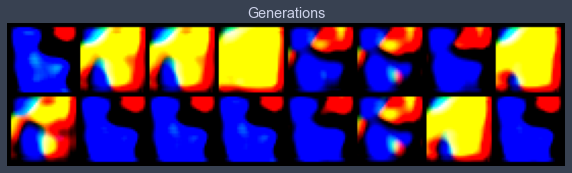

Epoch: 1, discrimiantor fake error: 0.428, discriminator real acc: 0.57
Epoch: 2, discrimiantor fake error: 0.446, discriminator real acc: 0.547
Epoch: 3, discrimiantor fake error: 0.365, discriminator real acc: 0.638
Epoch: 4, discrimiantor fake error: 0.343, discriminator real acc: 0.656
Epoch: 5, discrimiantor fake error: 0.285, discriminator real acc: 0.716
Epoch: 6, discrimiantor fake error: 0.311, discriminator real acc: 0.689
Epoch: 7, discrimiantor fake error: 0.211, discriminator real acc: 0.793
Epoch: 8, discrimiantor fake error: 0.124, discriminator real acc: 0.878
Epoch: 9, discrimiantor fake error: 0.142, discriminator real acc: 0.858


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch: 10, discrimiantor fake error: 0.134, discriminator real acc: 0.866
fixed_labels=tensor([11, 35,  9, 13, 13, 30, 35, 28,  2, 42, 16, 12,  9,  5, 13, 42],
       device='cuda:0')


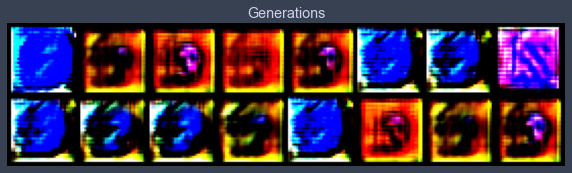

Epoch: 11, discrimiantor fake error: 0.0858, discriminator real acc: 0.915
Epoch: 12, discrimiantor fake error: 0.0385, discriminator real acc: 0.96
Epoch: 13, discrimiantor fake error: 0.11, discriminator real acc: 0.89
Epoch: 14, discrimiantor fake error: 0.0671, discriminator real acc: 0.932
Epoch: 15, discrimiantor fake error: 0.0545, discriminator real acc: 0.946
Epoch: 16, discrimiantor fake error: 0.0138, discriminator real acc: 0.986
Epoch: 17, discrimiantor fake error: 0.0245, discriminator real acc: 0.974
Epoch: 18, discrimiantor fake error: 0.012, discriminator real acc: 0.989
Epoch: 19, discrimiantor fake error: 0.00692, discriminator real acc: 0.993


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch: 20, discrimiantor fake error: 0.0431, discriminator real acc: 0.955
fixed_labels=tensor([11, 35,  9, 13, 13, 30, 35, 28,  2, 42, 16, 12,  9,  5, 13, 42],
       device='cuda:0')


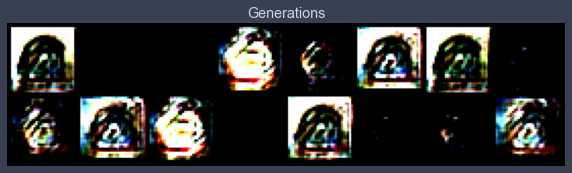

Epoch: 21, discrimiantor fake error: 0.00974, discriminator real acc: 0.991
Epoch: 22, discrimiantor fake error: 0.00495, discriminator real acc: 0.995
Epoch: 23, discrimiantor fake error: 0.00409, discriminator real acc: 0.996
Epoch: 24, discrimiantor fake error: 0.00248, discriminator real acc: 0.997
Epoch: 25, discrimiantor fake error: 0.0619, discriminator real acc: 0.963
Epoch: 26, discrimiantor fake error: 0.237, discriminator real acc: 0.763
Epoch: 27, discrimiantor fake error: 0.165, discriminator real acc: 0.836
Epoch: 28, discrimiantor fake error: 0.114, discriminator real acc: 0.886
Epoch: 29, discrimiantor fake error: 0.0286, discriminator real acc: 0.972


In [149]:
G_losses = []
D_losses = []
num_epochs = 30
for epoch in range(num_epochs):
    # For each batch in the dataloader
    discriminator_fake_acc = []
    discriminator_real_acc = []
    for i, data in enumerate(train_loader, 0):
        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Train with all-real batch
        discriminator_optimizer.zero_grad()
        # Format batch
        real_images = data[0].to(device)
        y = data[1]
        y = Functional.one_hot(y, numb_classess).to(device).float()
        b_size = real_images.size(0)
        label = torch.ones((b_size,), dtype=torch.float, device=device) # Setting labels for real images -
        # Forward pass real batch through D
        output = cond_discriminator(real_images, y).view(-1)
        # Calculate loss on all-real batch
        error_discriminator_real = criterion(output, label)
        # Calculate gradients for D in backward pass
        error_discriminator_real.backward()
        discriminator_real_acc.append(output.mean().item())

        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(b_size, 128, device=device)
        # Generate fake image batch with Generator
        fake_images = cond_generator(noise, y)
        label_fake = torch.zeros((b_size,), dtype=torch.float, device=device)           # fake ones with 0s
        # Classify all fake batch with Discriminator
        output = cond_discriminator(fake_images.detach(), y).view(-1)
        # Calculate D's loss on the all-fake batch
        error_discriminator_fake = criterion(output, label_fake)
        # Calculate the gradients for this batch, accumulated (summed) with previous gradients
        error_discriminator_fake.backward()
        discriminator_fake_acc.append(output.mean().item())
        # Compute error of D as sum over the fake and the real batches
        error_discriminator = error_discriminator_real + error_discriminator_fake

        # Update D - IMPORTANT - OPTIMIZER ONLY HERE - ITS A TRICK THAT ENSURES THAT LEARNING IS BOTH ON REAL AND FAKE IMAGES AT THE SAME MOMENT
        discriminator_optimizer.step()
        for _ in range(4):
            ############################
            # (2) Update G network: maximize log(D(G(z)))
            ###########################

            fake_images = cond_generator(noise, y)
            generator_optimizer.zero_grad()
            label = torch.ones((b_size,), dtype=torch.float, device=device)  # fake labels are real for generator cost
            # Since we just updated D, perform another forward pass of all-fake batch through D
            output = cond_discriminator(fake_images, y).view(-1)
            # Calculate G's loss based on this output
            error_generator = criterion(output, label)
            # Calculate gradients for G
            error_generator.backward()
            D_G_z2 = output.mean().item()
            # Update G
            generator_optimizer.step()

            # Output training stats
            # Save Losses for plotting later
            G_losses.append(error_generator.item())
            D_losses.append(error_discriminator.item())

    print(f"Epoch: {epoch}, discrimiantor fake error: {np.mean(discriminator_fake_acc):.3}, discriminator real acc: {np.mean(discriminator_real_acc):.3}")
    generator_scheduler.step()
    discriminator_scheduler.step()
    # if epoch % 10 == 0:
    with torch.no_grad():
        print(f"{fixed_labels=}")
        fake = cond_generator(fixed_noise, fixed_labels_one_hot).detach().cpu()
    grid = torchvision.utils.make_grid(fake)
    grid = grid.permute(1, 2, 0)
    plt.figure(figsize=(10,10))
    plt.title(f"Generations")
    plt.imshow(grid)
    plt.axis('off')
    plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


fixed_labels=tensor([11, 35,  9, 13, 13, 30, 35, 28,  2, 42, 16, 12,  9,  5, 13, 42],
       device='cuda:0')


(-0.5, 273.5, 69.5, -0.5)

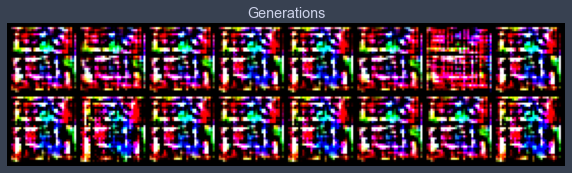

In [156]:
with torch.no_grad():
    print(f"{fixed_labels=}")
    fake = cond_generator(fixed_noise, fixed_labels_one_hot).detach().cpu()
grid = torchvision.utils.make_grid(fake)
grid = grid.permute(1, 2, 0)
plt.figure(figsize=(10,10))
plt.title(f"Generations")
plt.imshow(grid)
plt.axis('off')

In [27]:
class CondSignsDiscriminator(nn.Module):
    def __init__(self):
        super().__init__()
        self.class_layer_1 = nn.Linear(numb_classess, int(numb_classess*2/3))
        self.class_leakyrelu = nn.LeakyReLU(0.2)
        self.drop_class_1 = nn.Dropout(0.6)

        self.conv_1 = nn.Conv2d(in_channels=3, out_channels=30, kernel_size=(3,3))
        self.bn_1 = nn.BatchNorm2d(30)
        self.conv_leakyrelu_1 = nn.LeakyReLU(0.2)

        self.conv_2 = nn.Conv2d(in_channels=30, out_channels=65, kernel_size=(3,3), stride=(2,2))
        self.bn_2 = nn.BatchNorm2d(65)
        self.conv_leakyrelu_2 = nn.LeakyReLU(0.2)

        self.conv_3 = nn.Conv2d(in_channels=65, out_channels=128, kernel_size=(3,3), stride=(1,1))
        self.bn_3 = nn.BatchNorm2d(128)
        self.conv_leakyrelu_3 = nn.LeakyReLU(0.2)

        self.conv_4 = nn.Conv2d(in_channels=128, out_channels=128, kernel_size=(3,3), stride=(2,2))
        self.bn_4 = nn.BatchNorm2d(128)
        self.conv_leakyrelu_4 = nn.LeakyReLU(0.2)

        # 512 = 128 * 2x2

        self.dense_1 = nn.Linear(5*5*128 + int(numb_classess*2/3), 1100)
        self.drop_1 = nn.Dropout(0.6)
        self.dense_2 = nn.Linear(1100, 100)
        self.drop_2 = nn.Dropout(0.6)
        self.dense_3 = nn.Linear(100, 15)
        self.out_layer = nn.Linear(15, 1)

        self.dense_leakyrelu_1 = nn.LeakyReLU(0.2)
        self.dense_leakyrelu_2 = nn.LeakyReLU(0.2)
        self.dense_leakyrelu_3 = nn.LeakyReLU(0.2)

    def forward(self, img_inp, class_info):
        cl_info = self.class_layer_1(class_info)
        cl_info = self.class_leakyrelu(cl_info)
        cl_info = self.drop_class_1(cl_info)

        # print(f"DISCRIMINATOR | cl_info after 3 cl_info: {cl_info.size()=}")

        img = self.bn_1(self.conv_leakyrelu_1(self.conv_1(img_inp)))
        # print(f"DISCRIMINATOR | img after 1 conv: {img.size()=}")
        img = self.bn_2(self.conv_leakyrelu_2(self.conv_2(img)))
        # print(f"DISCRIMINATOR | img after 2 conv: {img.size()=}")
        img = self.bn_3(self.conv_leakyrelu_3(self.conv_3(img)))
        # print(f"DISCRIMINATOR | img after 3 conv: {img.size()=}")
        img = self.bn_4(self.conv_leakyrelu_4(self.conv_4(img)))
        # print(f"DISCRIMINATOR | img after 4 conv: {img.size()=}")

        img = torch.flatten(img, 1)
        # print(f"DISCRIMINATOR | img after flatten: {img.size()=}")
        fc_inp = torch.cat([img, cl_info], 1)
        # print(f"DISCRIMINATOR | fc_inp after cat: {fc_inp.size()=}")
        fc_inp = self.dense_leakyrelu_1(self.dense_1(fc_inp))
        fc_inp = self.drop_1(fc_inp)
        # print(f"DISCRIMINATOR | fc_inp after dense1: {fc_inp.size()=}")
        fc_inp = self.dense_leakyrelu_2(self.dense_2(fc_inp))
        fc_inp = self.drop_2(fc_inp)
        # print(f"DISCRIMINATOR | fc_inp after dense2: {fc_inp.size()=}")
        fc_inp = self.dense_leakyrelu_3(self.dense_3(fc_inp))
        # print(f"DISCRIMINATOR | fc_inp after dense3: {fc_inp.size()=}")
        fc_inp = self.out_layer(fc_inp)
        # print(f"DISCRIMINATOR | fc_inp at the end: {fc_inp.size()=}")

        return fc_inp

In [28]:
class CondSignsGenerator(nn.Module):
    def __init__(self, latent_dim=150):
        super().__init__()
        self.dense_1 = nn.Linear(latent_dim + numb_classess, 128*8)
        self.dense_leakyrelu_1 = nn.LeakyReLU(0.2)

        self.dense_2 = nn.Linear(128*8, 32*8*8)
        self.dense_leakyrelu_2 = nn.LeakyReLU(0.2)

        self.conv_1 = nn.Conv2d(in_channels=32, out_channels=64, kernel_size=(5,5), stride=(1,1), padding=(2,2))
        self.conv_leakyrelu_1 = nn.LeakyReLU(0.2)
        self.conv_bn_1 = nn.BatchNorm2d(64)

        self.conv_transpose_1 = nn.ConvTranspose2d(in_channels=64, out_channels=80, kernel_size=(4,4), stride=(2,2), padding=(1,1))
        self.conv_bn_transpose_1 = nn.BatchNorm2d(80)

        self.conv_transpose_2 = nn.ConvTranspose2d(in_channels=80, out_channels=100, kernel_size=(4,4), stride=(2,2), padding=(1,1))
        self.conv_bn_transpose_2 = nn.BatchNorm2d(100)

        # 32 x 32 x 128

        self.conv_2 = nn.Conv2d(in_channels=100, out_channels=55, kernel_size=(5,5), stride=(1,1), padding=(2,2))
        self.conv_leakyrelu_2 = nn.LeakyReLU(0.2)
        self.conv_bn_2 = nn.BatchNorm2d(55)

        self.conv_3 = nn.Conv2d(in_channels=55, out_channels=15, kernel_size=(5,5), stride=(1,1), padding=(2,2))
        self.conv_leakyrelu_3 = nn.LeakyReLU(0.2)
        self.conv_bn_3 = nn.BatchNorm2d(15)

        self.out_conv = nn.Conv2d(in_channels=15, out_channels=3, kernel_size=(5,5), stride=(1,1), padding=(2,2))

    def forward(self, inp_noise, class_onehot):
        x = torch.cat([inp_noise, class_onehot], 1)
        # print(f"GENERATOR | x after cat: {x.size()=}")
        x = self.dense_leakyrelu_1(self.dense_1(x))
        # print(f"GENERATOR | x after dense1: {x.size()=}")
        x = self.dense_leakyrelu_2(self.dense_2(x))
        # print(f"GENERATOR | x after dense2: {x.size()=}")
        x = x.view([-1, 32, 8, 8])
        # print(f"GENERATOR | x after view: {x.size()=}")

        x = self.conv_bn_1(self.conv_leakyrelu_1(self.conv_1(x)))
        # print(f"GENERATOR | x after conv_1: {x.size()=}")

        x = self.conv_bn_transpose_1(self.conv_transpose_1(x))
        # print(f"GENERATOR | x after convt_1: {x.size()=}")
        x = self.conv_bn_transpose_2(self.conv_transpose_2(x))
        # print(f"GENERATOR | x after convt_2: {x.size()=}")

        x = self.conv_bn_2(self.conv_leakyrelu_2(self.conv_2(x)))
        # print(f"GENERATOR | x after conv2: {x.size()=}")
        x = self.conv_bn_3(self.conv_leakyrelu_3(self.conv_3(x)))
        # print(f"GENERATOR | x after conv3: {x.size()=}")

        x = self.out_conv(x)
        # print(f"GENERATOR | x out: {x.size()=}")

        return x

In [29]:
LATENT_DIM_SIZE = 64
cond_generator = CondSignsGenerator(latent_dim=LATENT_DIM_SIZE).to(device)
cond_discriminator = CondSignsDiscriminator().to(device)

# Optimizers
generator_optimizer = torch.optim.Adam(cond_generator.parameters(), lr=0.0001)
generator_scheduler = optim.lr_scheduler.ExponentialLR(optimizer=generator_optimizer, gamma=0.99)
discriminator_optimizer = torch.optim.Adam(cond_discriminator.parameters(), lr=0.001, weight_decay=0.01)
discriminator_scheduler = optim.lr_scheduler.ExponentialLR(optimizer=discriminator_optimizer, gamma=0.99)

# loss
criterion = nn.MSELoss()

In [30]:
fixed_noise = torch.randn(16, LATENT_DIM_SIZE, device=device)
fixed_labels = next(iter(train_loader))[1]
fixed_labels = fixed_labels[:16].to(device)
fixed_labels_one_hot = Functional.one_hot(fixed_labels, numb_classess).float()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch: 0, discrimiantor fake error: 0.0946, discriminator real acc: 0.888
fixed_labels=tensor([ 1,  2,  1, 38, 13,  6,  8, 10, 25, 25, 36,  1, 13, 14,  9, 10],
       device='cuda:0')


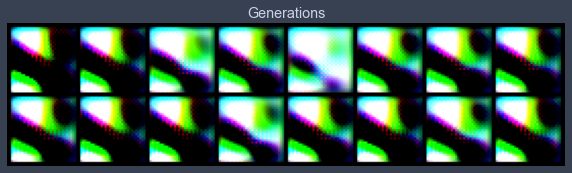

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch: 1, discrimiantor fake error: 0.0564, discriminator real acc: 0.938
fixed_labels=tensor([ 1,  2,  1, 38, 13,  6,  8, 10, 25, 25, 36,  1, 13, 14,  9, 10],
       device='cuda:0')


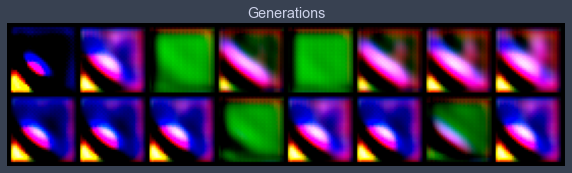

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch: 2, discrimiantor fake error: 0.0443, discriminator real acc: 0.95
fixed_labels=tensor([ 1,  2,  1, 38, 13,  6,  8, 10, 25, 25, 36,  1, 13, 14,  9, 10],
       device='cuda:0')


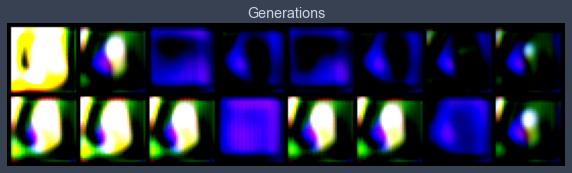

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch: 3, discrimiantor fake error: 0.0359, discriminator real acc: 0.965
fixed_labels=tensor([ 1,  2,  1, 38, 13,  6,  8, 10, 25, 25, 36,  1, 13, 14,  9, 10],
       device='cuda:0')


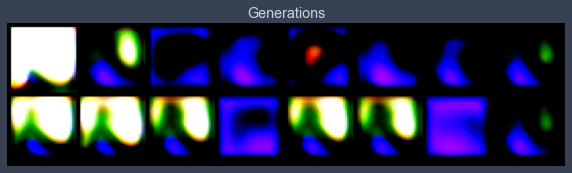

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch: 4, discrimiantor fake error: 0.0225, discriminator real acc: 0.975
fixed_labels=tensor([ 1,  2,  1, 38, 13,  6,  8, 10, 25, 25, 36,  1, 13, 14,  9, 10],
       device='cuda:0')


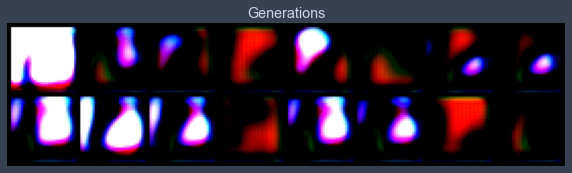

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch: 5, discrimiantor fake error: 0.0265, discriminator real acc: 0.97
fixed_labels=tensor([ 1,  2,  1, 38, 13,  6,  8, 10, 25, 25, 36,  1, 13, 14,  9, 10],
       device='cuda:0')


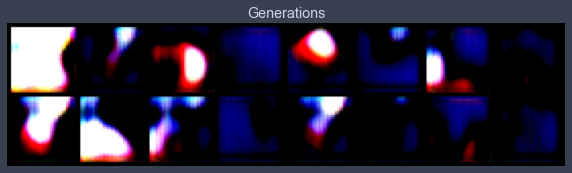

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch: 6, discrimiantor fake error: 0.0288, discriminator real acc: 0.969
fixed_labels=tensor([ 1,  2,  1, 38, 13,  6,  8, 10, 25, 25, 36,  1, 13, 14,  9, 10],
       device='cuda:0')


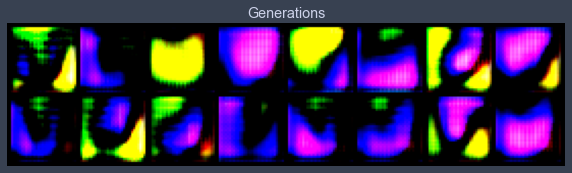

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch: 7, discrimiantor fake error: 0.0229, discriminator real acc: 0.972
fixed_labels=tensor([ 1,  2,  1, 38, 13,  6,  8, 10, 25, 25, 36,  1, 13, 14,  9, 10],
       device='cuda:0')


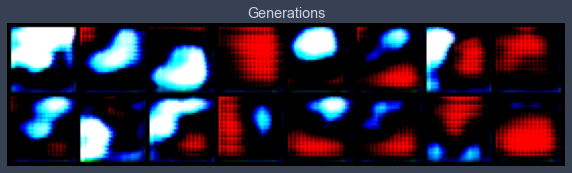

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch: 8, discrimiantor fake error: 0.0482, discriminator real acc: 0.947
fixed_labels=tensor([ 1,  2,  1, 38, 13,  6,  8, 10, 25, 25, 36,  1, 13, 14,  9, 10],
       device='cuda:0')


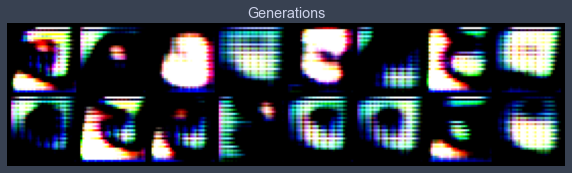

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch: 9, discrimiantor fake error: 0.0469, discriminator real acc: 0.95
fixed_labels=tensor([ 1,  2,  1, 38, 13,  6,  8, 10, 25, 25, 36,  1, 13, 14,  9, 10],
       device='cuda:0')


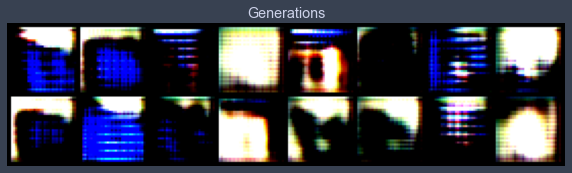

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch: 10, discrimiantor fake error: 0.0259, discriminator real acc: 0.972
fixed_labels=tensor([ 1,  2,  1, 38, 13,  6,  8, 10, 25, 25, 36,  1, 13, 14,  9, 10],
       device='cuda:0')


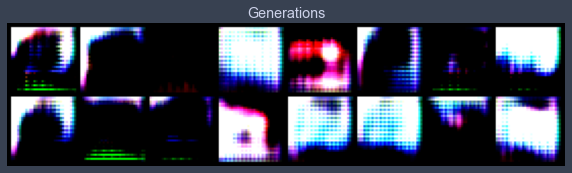

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch: 11, discrimiantor fake error: 0.0601, discriminator real acc: 0.937
fixed_labels=tensor([ 1,  2,  1, 38, 13,  6,  8, 10, 25, 25, 36,  1, 13, 14,  9, 10],
       device='cuda:0')


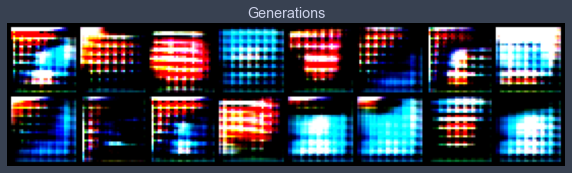

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch: 12, discrimiantor fake error: 0.06, discriminator real acc: 0.936
fixed_labels=tensor([ 1,  2,  1, 38, 13,  6,  8, 10, 25, 25, 36,  1, 13, 14,  9, 10],
       device='cuda:0')


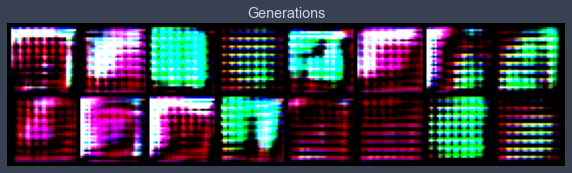

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch: 13, discrimiantor fake error: 0.0187, discriminator real acc: 0.979
fixed_labels=tensor([ 1,  2,  1, 38, 13,  6,  8, 10, 25, 25, 36,  1, 13, 14,  9, 10],
       device='cuda:0')


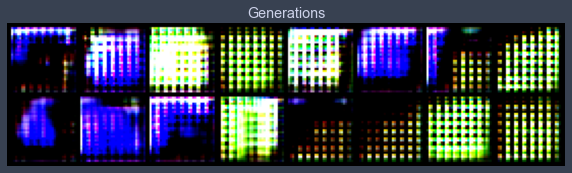

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch: 14, discrimiantor fake error: 0.0154, discriminator real acc: 0.981
fixed_labels=tensor([ 1,  2,  1, 38, 13,  6,  8, 10, 25, 25, 36,  1, 13, 14,  9, 10],
       device='cuda:0')


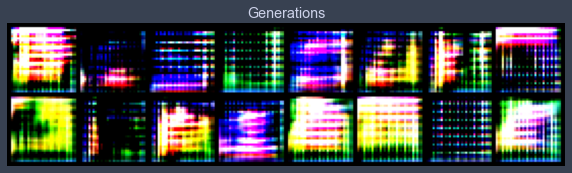

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch: 15, discrimiantor fake error: 0.0644, discriminator real acc: 0.933
fixed_labels=tensor([ 1,  2,  1, 38, 13,  6,  8, 10, 25, 25, 36,  1, 13, 14,  9, 10],
       device='cuda:0')


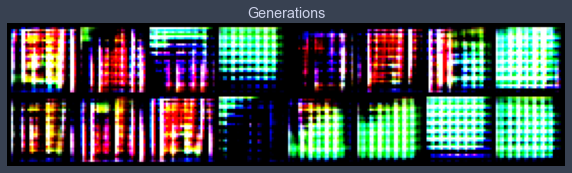

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch: 16, discrimiantor fake error: 0.0377, discriminator real acc: 0.959
fixed_labels=tensor([ 1,  2,  1, 38, 13,  6,  8, 10, 25, 25, 36,  1, 13, 14,  9, 10],
       device='cuda:0')


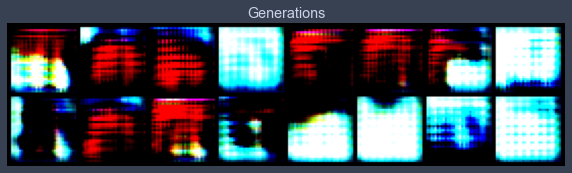

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch: 17, discrimiantor fake error: 0.0359, discriminator real acc: 0.96
fixed_labels=tensor([ 1,  2,  1, 38, 13,  6,  8, 10, 25, 25, 36,  1, 13, 14,  9, 10],
       device='cuda:0')


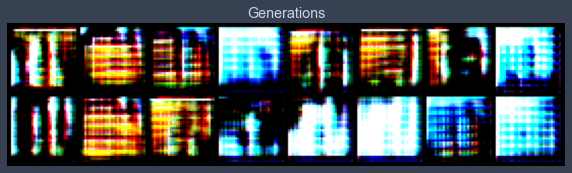

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch: 18, discrimiantor fake error: 0.0334, discriminator real acc: 0.963
fixed_labels=tensor([ 1,  2,  1, 38, 13,  6,  8, 10, 25, 25, 36,  1, 13, 14,  9, 10],
       device='cuda:0')


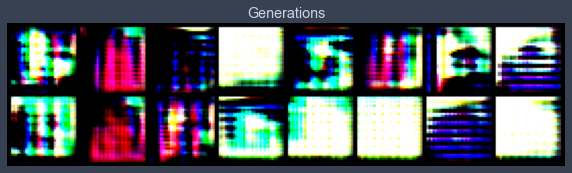

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch: 19, discrimiantor fake error: 0.0212, discriminator real acc: 0.974
fixed_labels=tensor([ 1,  2,  1, 38, 13,  6,  8, 10, 25, 25, 36,  1, 13, 14,  9, 10],
       device='cuda:0')


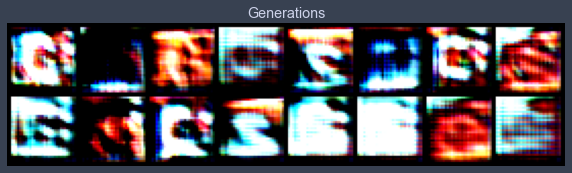

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch: 20, discrimiantor fake error: 0.0324, discriminator real acc: 0.965
fixed_labels=tensor([ 1,  2,  1, 38, 13,  6,  8, 10, 25, 25, 36,  1, 13, 14,  9, 10],
       device='cuda:0')


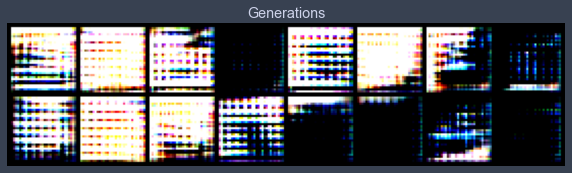

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch: 21, discrimiantor fake error: 0.0303, discriminator real acc: 0.965
fixed_labels=tensor([ 1,  2,  1, 38, 13,  6,  8, 10, 25, 25, 36,  1, 13, 14,  9, 10],
       device='cuda:0')


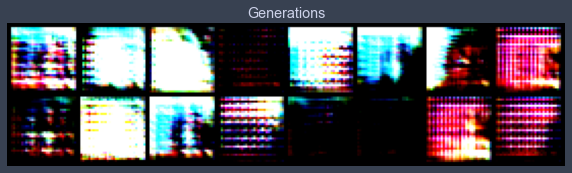

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch: 22, discrimiantor fake error: 0.0293, discriminator real acc: 0.968
fixed_labels=tensor([ 1,  2,  1, 38, 13,  6,  8, 10, 25, 25, 36,  1, 13, 14,  9, 10],
       device='cuda:0')


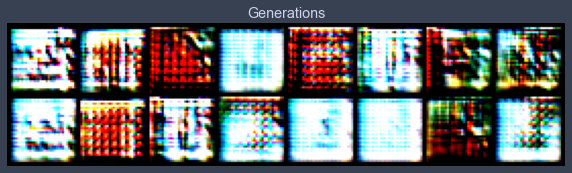

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch: 23, discrimiantor fake error: 0.0333, discriminator real acc: 0.963
fixed_labels=tensor([ 1,  2,  1, 38, 13,  6,  8, 10, 25, 25, 36,  1, 13, 14,  9, 10],
       device='cuda:0')


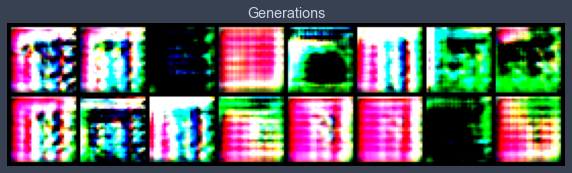

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch: 24, discrimiantor fake error: 0.042, discriminator real acc: 0.956
fixed_labels=tensor([ 1,  2,  1, 38, 13,  6,  8, 10, 25, 25, 36,  1, 13, 14,  9, 10],
       device='cuda:0')


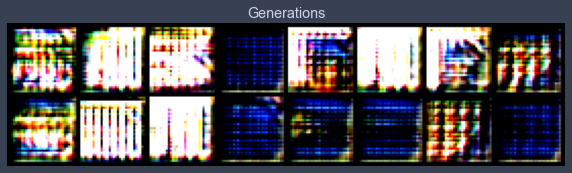

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch: 25, discrimiantor fake error: 0.0439, discriminator real acc: 0.952
fixed_labels=tensor([ 1,  2,  1, 38, 13,  6,  8, 10, 25, 25, 36,  1, 13, 14,  9, 10],
       device='cuda:0')


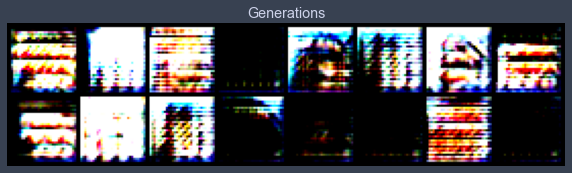

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch: 26, discrimiantor fake error: 0.078, discriminator real acc: 0.919
fixed_labels=tensor([ 1,  2,  1, 38, 13,  6,  8, 10, 25, 25, 36,  1, 13, 14,  9, 10],
       device='cuda:0')


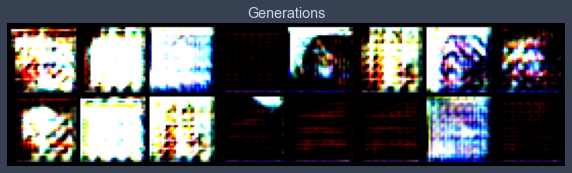

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch: 27, discrimiantor fake error: 0.075, discriminator real acc: 0.921
fixed_labels=tensor([ 1,  2,  1, 38, 13,  6,  8, 10, 25, 25, 36,  1, 13, 14,  9, 10],
       device='cuda:0')


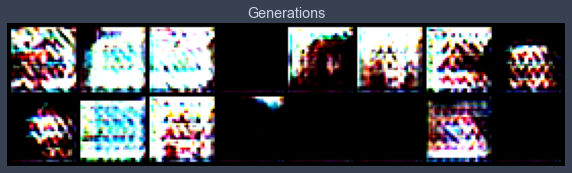

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch: 28, discrimiantor fake error: 0.0658, discriminator real acc: 0.929
fixed_labels=tensor([ 1,  2,  1, 38, 13,  6,  8, 10, 25, 25, 36,  1, 13, 14,  9, 10],
       device='cuda:0')


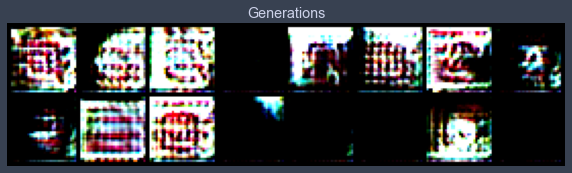

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch: 29, discrimiantor fake error: 0.0625, discriminator real acc: 0.932
fixed_labels=tensor([ 1,  2,  1, 38, 13,  6,  8, 10, 25, 25, 36,  1, 13, 14,  9, 10],
       device='cuda:0')


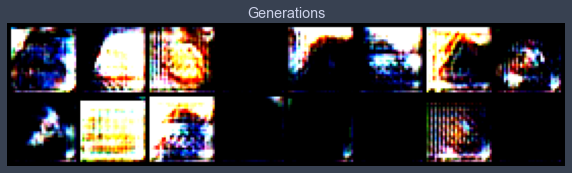

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch: 30, discrimiantor fake error: 0.0424, discriminator real acc: 0.951
fixed_labels=tensor([ 1,  2,  1, 38, 13,  6,  8, 10, 25, 25, 36,  1, 13, 14,  9, 10],
       device='cuda:0')


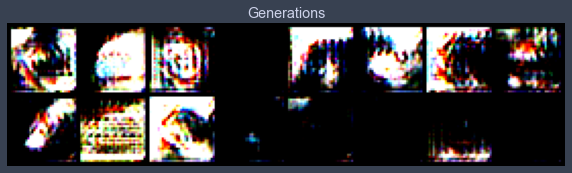

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch: 31, discrimiantor fake error: 0.0489, discriminator real acc: 0.951
fixed_labels=tensor([ 1,  2,  1, 38, 13,  6,  8, 10, 25, 25, 36,  1, 13, 14,  9, 10],
       device='cuda:0')


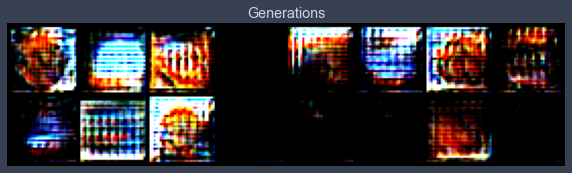

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch: 32, discrimiantor fake error: 0.0271, discriminator real acc: 0.968
fixed_labels=tensor([ 1,  2,  1, 38, 13,  6,  8, 10, 25, 25, 36,  1, 13, 14,  9, 10],
       device='cuda:0')


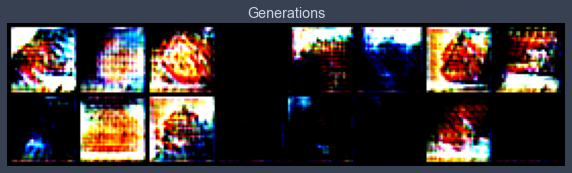

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch: 33, discrimiantor fake error: 0.0689, discriminator real acc: 0.927
fixed_labels=tensor([ 1,  2,  1, 38, 13,  6,  8, 10, 25, 25, 36,  1, 13, 14,  9, 10],
       device='cuda:0')


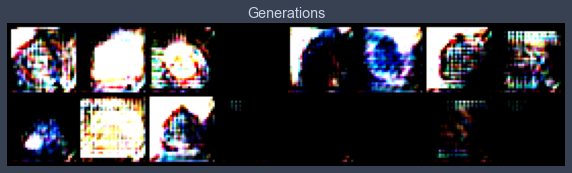

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch: 34, discrimiantor fake error: 0.0192, discriminator real acc: 0.977
fixed_labels=tensor([ 1,  2,  1, 38, 13,  6,  8, 10, 25, 25, 36,  1, 13, 14,  9, 10],
       device='cuda:0')


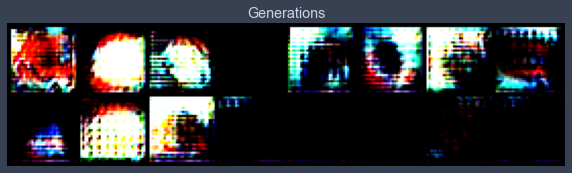

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch: 35, discrimiantor fake error: 0.0181, discriminator real acc: 0.978
fixed_labels=tensor([ 1,  2,  1, 38, 13,  6,  8, 10, 25, 25, 36,  1, 13, 14,  9, 10],
       device='cuda:0')


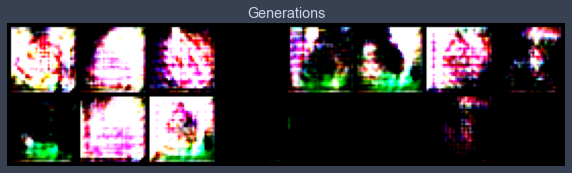

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch: 36, discrimiantor fake error: 0.0208, discriminator real acc: 0.974
fixed_labels=tensor([ 1,  2,  1, 38, 13,  6,  8, 10, 25, 25, 36,  1, 13, 14,  9, 10],
       device='cuda:0')


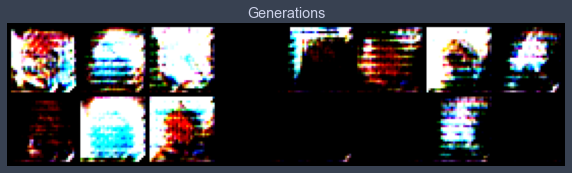

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch: 37, discrimiantor fake error: 0.0186, discriminator real acc: 0.978
fixed_labels=tensor([ 1,  2,  1, 38, 13,  6,  8, 10, 25, 25, 36,  1, 13, 14,  9, 10],
       device='cuda:0')


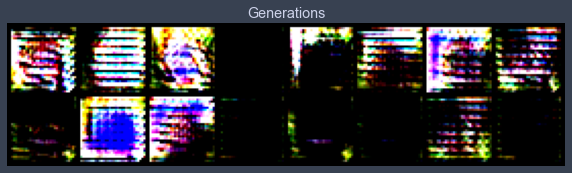

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch: 38, discrimiantor fake error: 0.0305, discriminator real acc: 0.964
fixed_labels=tensor([ 1,  2,  1, 38, 13,  6,  8, 10, 25, 25, 36,  1, 13, 14,  9, 10],
       device='cuda:0')


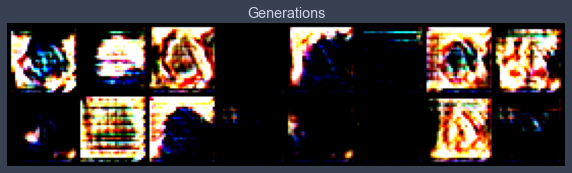

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch: 39, discrimiantor fake error: 0.0773, discriminator real acc: 0.922
fixed_labels=tensor([ 1,  2,  1, 38, 13,  6,  8, 10, 25, 25, 36,  1, 13, 14,  9, 10],
       device='cuda:0')


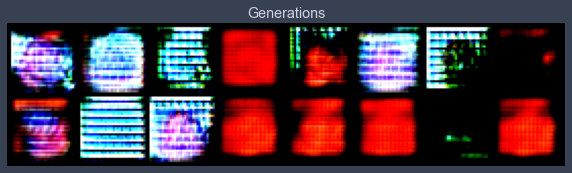

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch: 40, discrimiantor fake error: 0.0458, discriminator real acc: 0.949
fixed_labels=tensor([ 1,  2,  1, 38, 13,  6,  8, 10, 25, 25, 36,  1, 13, 14,  9, 10],
       device='cuda:0')


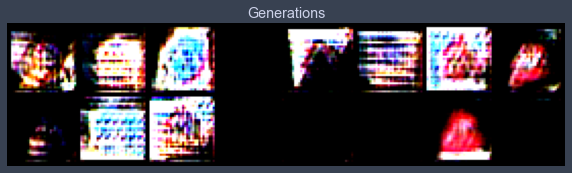

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch: 41, discrimiantor fake error: 0.0637, discriminator real acc: 0.931
fixed_labels=tensor([ 1,  2,  1, 38, 13,  6,  8, 10, 25, 25, 36,  1, 13, 14,  9, 10],
       device='cuda:0')


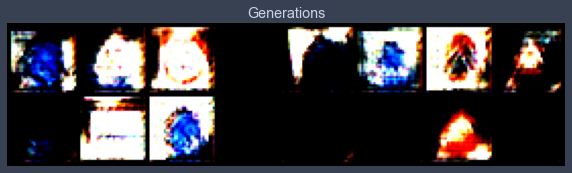

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch: 42, discrimiantor fake error: 0.0582, discriminator real acc: 0.939
fixed_labels=tensor([ 1,  2,  1, 38, 13,  6,  8, 10, 25, 25, 36,  1, 13, 14,  9, 10],
       device='cuda:0')


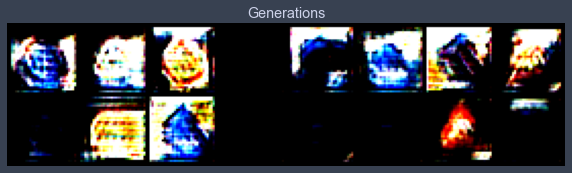

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch: 43, discrimiantor fake error: 0.0463, discriminator real acc: 0.95
fixed_labels=tensor([ 1,  2,  1, 38, 13,  6,  8, 10, 25, 25, 36,  1, 13, 14,  9, 10],
       device='cuda:0')


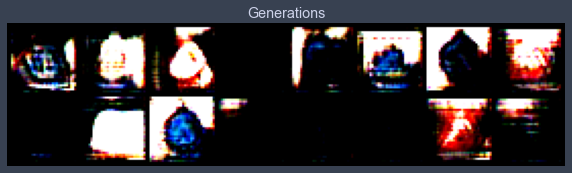

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch: 44, discrimiantor fake error: 0.0299, discriminator real acc: 0.964
fixed_labels=tensor([ 1,  2,  1, 38, 13,  6,  8, 10, 25, 25, 36,  1, 13, 14,  9, 10],
       device='cuda:0')


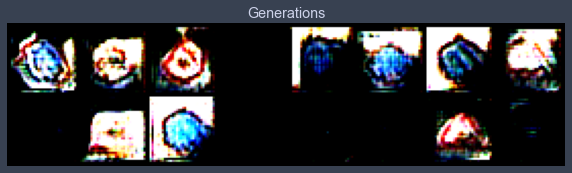

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch: 45, discrimiantor fake error: 0.036, discriminator real acc: 0.96
fixed_labels=tensor([ 1,  2,  1, 38, 13,  6,  8, 10, 25, 25, 36,  1, 13, 14,  9, 10],
       device='cuda:0')


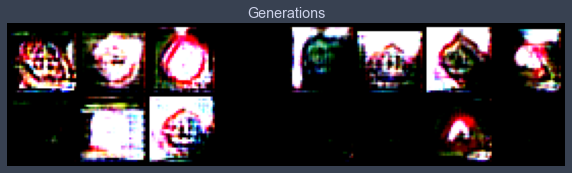

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch: 46, discrimiantor fake error: 0.0478, discriminator real acc: 0.949
fixed_labels=tensor([ 1,  2,  1, 38, 13,  6,  8, 10, 25, 25, 36,  1, 13, 14,  9, 10],
       device='cuda:0')


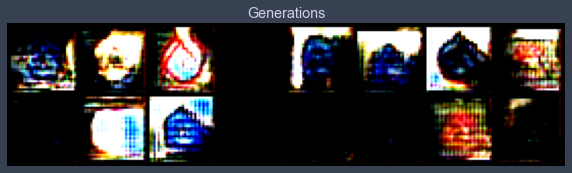

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch: 47, discrimiantor fake error: 0.0375, discriminator real acc: 0.958
fixed_labels=tensor([ 1,  2,  1, 38, 13,  6,  8, 10, 25, 25, 36,  1, 13, 14,  9, 10],
       device='cuda:0')


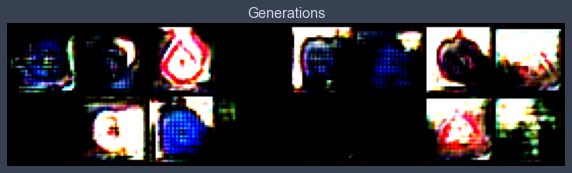

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch: 48, discrimiantor fake error: 0.0625, discriminator real acc: 0.934
fixed_labels=tensor([ 1,  2,  1, 38, 13,  6,  8, 10, 25, 25, 36,  1, 13, 14,  9, 10],
       device='cuda:0')


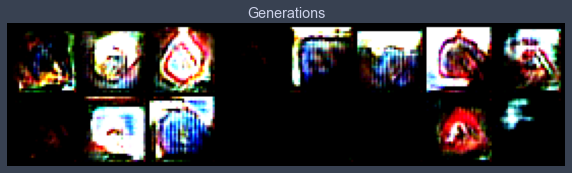

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch: 49, discrimiantor fake error: 0.0228, discriminator real acc: 0.972
fixed_labels=tensor([ 1,  2,  1, 38, 13,  6,  8, 10, 25, 25, 36,  1, 13, 14,  9, 10],
       device='cuda:0')


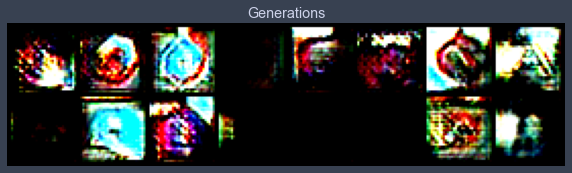

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch: 50, discrimiantor fake error: 0.0152, discriminator real acc: 0.979
fixed_labels=tensor([ 1,  2,  1, 38, 13,  6,  8, 10, 25, 25, 36,  1, 13, 14,  9, 10],
       device='cuda:0')


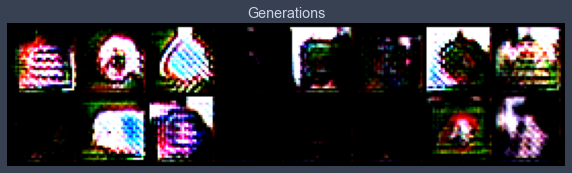

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch: 51, discrimiantor fake error: 0.0513, discriminator real acc: 0.942
fixed_labels=tensor([ 1,  2,  1, 38, 13,  6,  8, 10, 25, 25, 36,  1, 13, 14,  9, 10],
       device='cuda:0')


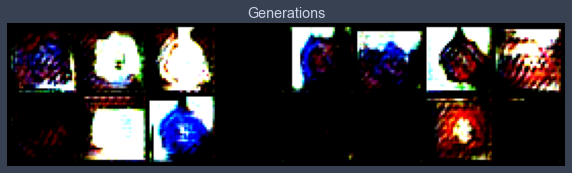

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch: 52, discrimiantor fake error: 0.101, discriminator real acc: 0.896
fixed_labels=tensor([ 1,  2,  1, 38, 13,  6,  8, 10, 25, 25, 36,  1, 13, 14,  9, 10],
       device='cuda:0')


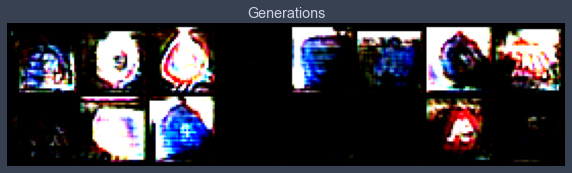

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch: 53, discrimiantor fake error: 0.0596, discriminator real acc: 0.936
fixed_labels=tensor([ 1,  2,  1, 38, 13,  6,  8, 10, 25, 25, 36,  1, 13, 14,  9, 10],
       device='cuda:0')


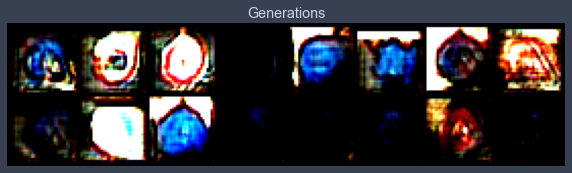

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch: 54, discrimiantor fake error: 0.0541, discriminator real acc: 0.942
fixed_labels=tensor([ 1,  2,  1, 38, 13,  6,  8, 10, 25, 25, 36,  1, 13, 14,  9, 10],
       device='cuda:0')


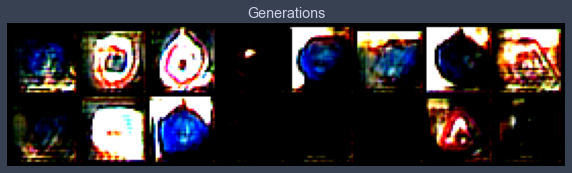

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch: 55, discrimiantor fake error: 0.0349, discriminator real acc: 0.961
fixed_labels=tensor([ 1,  2,  1, 38, 13,  6,  8, 10, 25, 25, 36,  1, 13, 14,  9, 10],
       device='cuda:0')


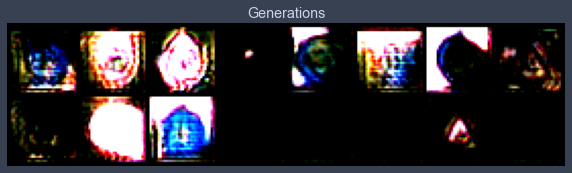

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch: 56, discrimiantor fake error: 0.038, discriminator real acc: 0.956
fixed_labels=tensor([ 1,  2,  1, 38, 13,  6,  8, 10, 25, 25, 36,  1, 13, 14,  9, 10],
       device='cuda:0')


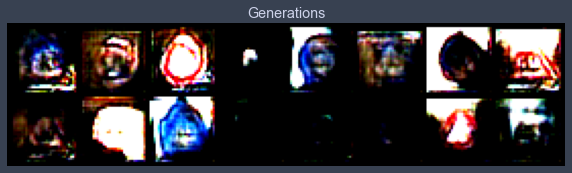

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch: 57, discrimiantor fake error: 0.0277, discriminator real acc: 0.97
fixed_labels=tensor([ 1,  2,  1, 38, 13,  6,  8, 10, 25, 25, 36,  1, 13, 14,  9, 10],
       device='cuda:0')


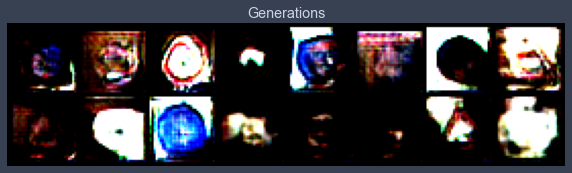

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch: 58, discrimiantor fake error: 0.0461, discriminator real acc: 0.948
fixed_labels=tensor([ 1,  2,  1, 38, 13,  6,  8, 10, 25, 25, 36,  1, 13, 14,  9, 10],
       device='cuda:0')


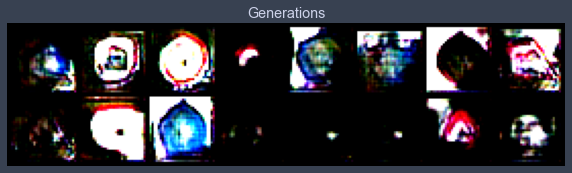

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch: 59, discrimiantor fake error: 0.0273, discriminator real acc: 0.968
fixed_labels=tensor([ 1,  2,  1, 38, 13,  6,  8, 10, 25, 25, 36,  1, 13, 14,  9, 10],
       device='cuda:0')


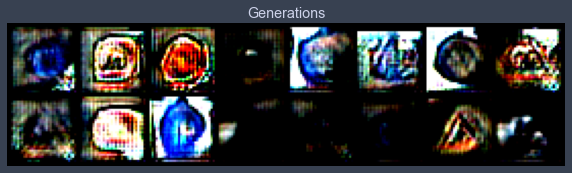

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch: 60, discrimiantor fake error: 0.0207, discriminator real acc: 0.976
fixed_labels=tensor([ 1,  2,  1, 38, 13,  6,  8, 10, 25, 25, 36,  1, 13, 14,  9, 10],
       device='cuda:0')


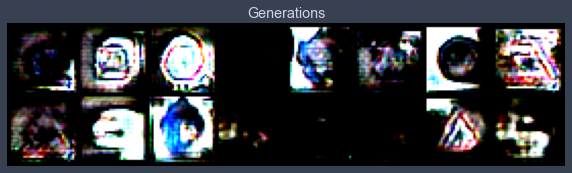

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch: 61, discrimiantor fake error: 0.0545, discriminator real acc: 0.94
fixed_labels=tensor([ 1,  2,  1, 38, 13,  6,  8, 10, 25, 25, 36,  1, 13, 14,  9, 10],
       device='cuda:0')


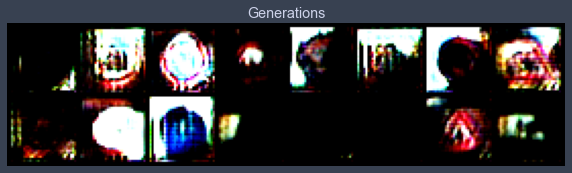

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch: 62, discrimiantor fake error: 0.0231, discriminator real acc: 0.973
fixed_labels=tensor([ 1,  2,  1, 38, 13,  6,  8, 10, 25, 25, 36,  1, 13, 14,  9, 10],
       device='cuda:0')


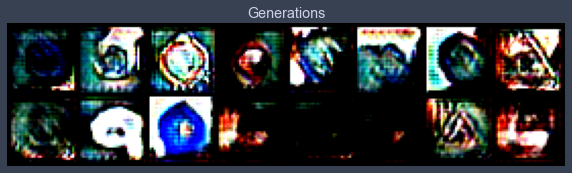

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch: 63, discrimiantor fake error: 0.042, discriminator real acc: 0.953
fixed_labels=tensor([ 1,  2,  1, 38, 13,  6,  8, 10, 25, 25, 36,  1, 13, 14,  9, 10],
       device='cuda:0')


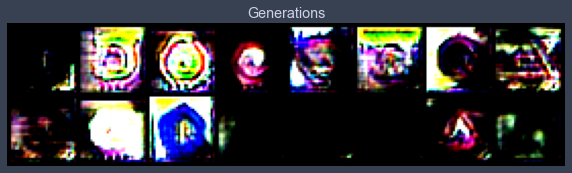

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch: 64, discrimiantor fake error: 0.0196, discriminator real acc: 0.975
fixed_labels=tensor([ 1,  2,  1, 38, 13,  6,  8, 10, 25, 25, 36,  1, 13, 14,  9, 10],
       device='cuda:0')


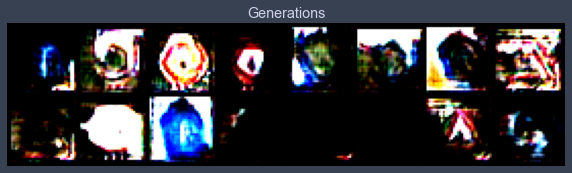

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch: 65, discrimiantor fake error: 0.0645, discriminator real acc: 0.932
fixed_labels=tensor([ 1,  2,  1, 38, 13,  6,  8, 10, 25, 25, 36,  1, 13, 14,  9, 10],
       device='cuda:0')


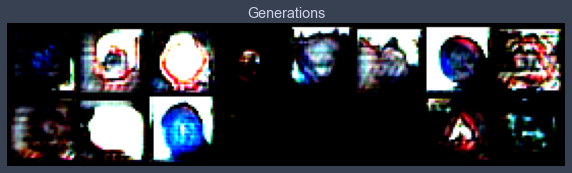

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch: 66, discrimiantor fake error: 0.0443, discriminator real acc: 0.951
fixed_labels=tensor([ 1,  2,  1, 38, 13,  6,  8, 10, 25, 25, 36,  1, 13, 14,  9, 10],
       device='cuda:0')


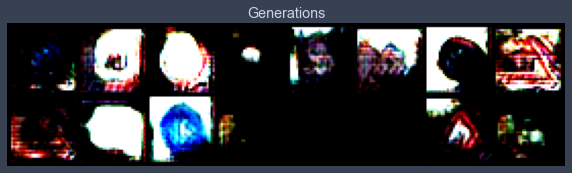

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch: 67, discrimiantor fake error: 0.0354, discriminator real acc: 0.959
fixed_labels=tensor([ 1,  2,  1, 38, 13,  6,  8, 10, 25, 25, 36,  1, 13, 14,  9, 10],
       device='cuda:0')


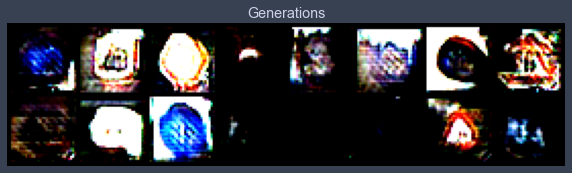

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch: 68, discrimiantor fake error: 0.0303, discriminator real acc: 0.966
fixed_labels=tensor([ 1,  2,  1, 38, 13,  6,  8, 10, 25, 25, 36,  1, 13, 14,  9, 10],
       device='cuda:0')


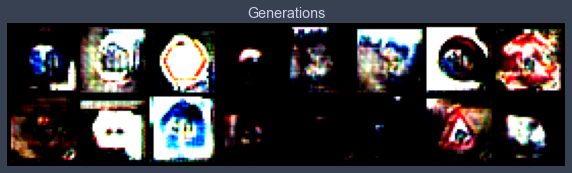

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch: 69, discrimiantor fake error: 0.0393, discriminator real acc: 0.955
fixed_labels=tensor([ 1,  2,  1, 38, 13,  6,  8, 10, 25, 25, 36,  1, 13, 14,  9, 10],
       device='cuda:0')


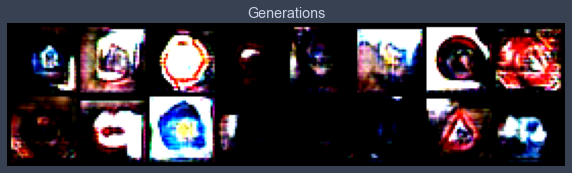

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch: 70, discrimiantor fake error: 0.0222, discriminator real acc: 0.973
fixed_labels=tensor([ 1,  2,  1, 38, 13,  6,  8, 10, 25, 25, 36,  1, 13, 14,  9, 10],
       device='cuda:0')


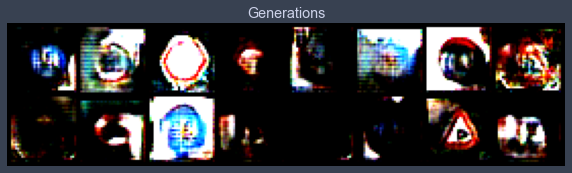

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch: 71, discrimiantor fake error: 0.0568, discriminator real acc: 0.938
fixed_labels=tensor([ 1,  2,  1, 38, 13,  6,  8, 10, 25, 25, 36,  1, 13, 14,  9, 10],
       device='cuda:0')


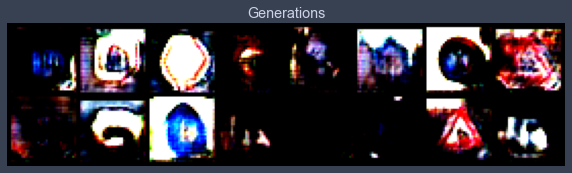

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch: 72, discrimiantor fake error: 0.0388, discriminator real acc: 0.96
fixed_labels=tensor([ 1,  2,  1, 38, 13,  6,  8, 10, 25, 25, 36,  1, 13, 14,  9, 10],
       device='cuda:0')


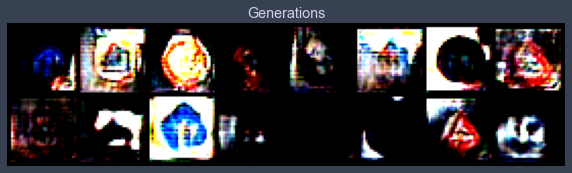

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch: 73, discrimiantor fake error: 0.019, discriminator real acc: 0.975
fixed_labels=tensor([ 1,  2,  1, 38, 13,  6,  8, 10, 25, 25, 36,  1, 13, 14,  9, 10],
       device='cuda:0')


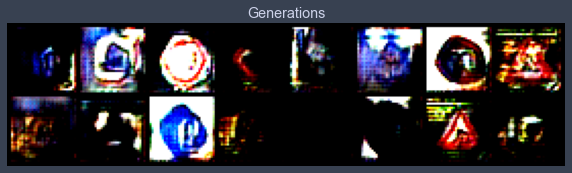

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch: 74, discrimiantor fake error: 0.0236, discriminator real acc: 0.97
fixed_labels=tensor([ 1,  2,  1, 38, 13,  6,  8, 10, 25, 25, 36,  1, 13, 14,  9, 10],
       device='cuda:0')


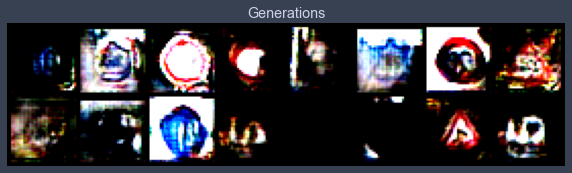

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch: 75, discrimiantor fake error: 0.0479, discriminator real acc: 0.947
fixed_labels=tensor([ 1,  2,  1, 38, 13,  6,  8, 10, 25, 25, 36,  1, 13, 14,  9, 10],
       device='cuda:0')


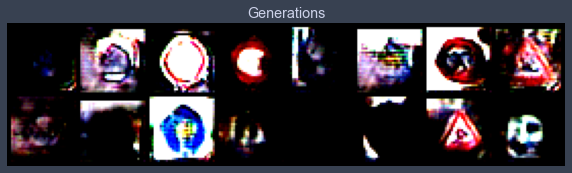

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch: 76, discrimiantor fake error: 0.0421, discriminator real acc: 0.955
fixed_labels=tensor([ 1,  2,  1, 38, 13,  6,  8, 10, 25, 25, 36,  1, 13, 14,  9, 10],
       device='cuda:0')


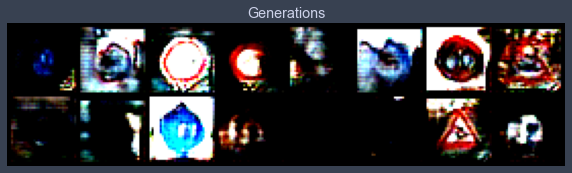

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch: 77, discrimiantor fake error: 0.0382, discriminator real acc: 0.957
fixed_labels=tensor([ 1,  2,  1, 38, 13,  6,  8, 10, 25, 25, 36,  1, 13, 14,  9, 10],
       device='cuda:0')


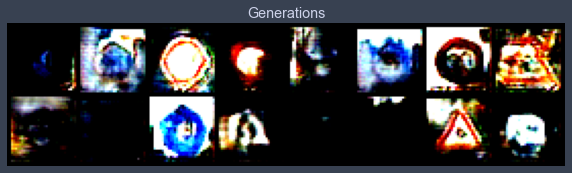

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch: 78, discrimiantor fake error: 0.0301, discriminator real acc: 0.965
fixed_labels=tensor([ 1,  2,  1, 38, 13,  6,  8, 10, 25, 25, 36,  1, 13, 14,  9, 10],
       device='cuda:0')


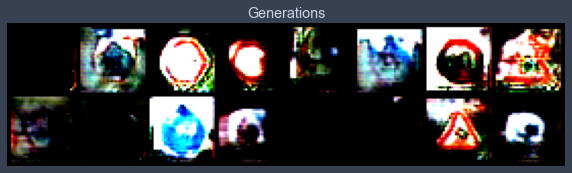

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch: 79, discrimiantor fake error: 0.0406, discriminator real acc: 0.954
fixed_labels=tensor([ 1,  2,  1, 38, 13,  6,  8, 10, 25, 25, 36,  1, 13, 14,  9, 10],
       device='cuda:0')


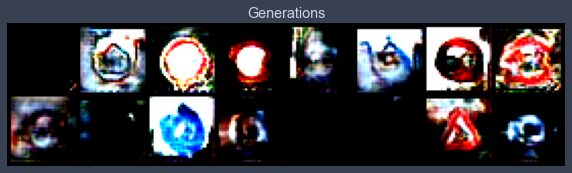

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch: 80, discrimiantor fake error: 0.0426, discriminator real acc: 0.954
fixed_labels=tensor([ 1,  2,  1, 38, 13,  6,  8, 10, 25, 25, 36,  1, 13, 14,  9, 10],
       device='cuda:0')


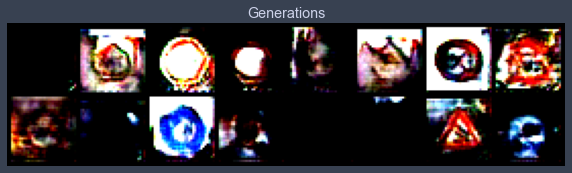

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch: 81, discrimiantor fake error: 0.0361, discriminator real acc: 0.957
fixed_labels=tensor([ 1,  2,  1, 38, 13,  6,  8, 10, 25, 25, 36,  1, 13, 14,  9, 10],
       device='cuda:0')


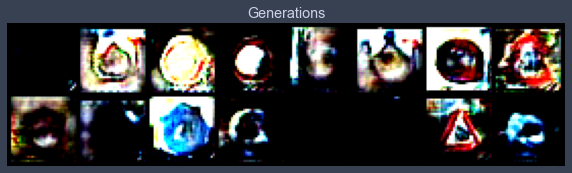

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch: 82, discrimiantor fake error: 0.0365, discriminator real acc: 0.96
fixed_labels=tensor([ 1,  2,  1, 38, 13,  6,  8, 10, 25, 25, 36,  1, 13, 14,  9, 10],
       device='cuda:0')


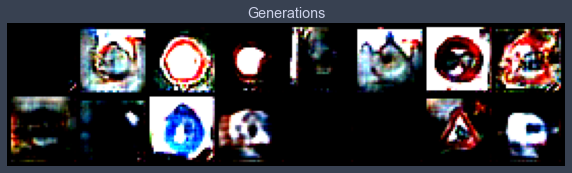

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch: 83, discrimiantor fake error: 0.024, discriminator real acc: 0.971
fixed_labels=tensor([ 1,  2,  1, 38, 13,  6,  8, 10, 25, 25, 36,  1, 13, 14,  9, 10],
       device='cuda:0')


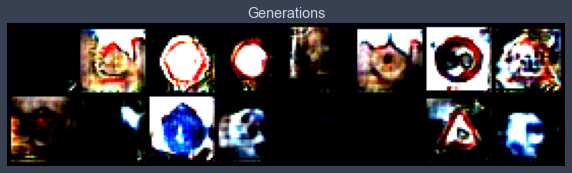

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch: 84, discrimiantor fake error: 0.0378, discriminator real acc: 0.956
fixed_labels=tensor([ 1,  2,  1, 38, 13,  6,  8, 10, 25, 25, 36,  1, 13, 14,  9, 10],
       device='cuda:0')


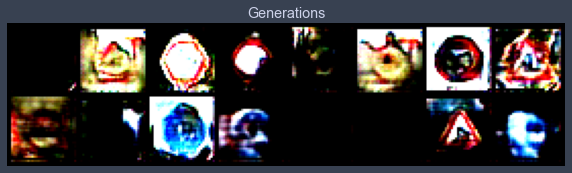

KeyboardInterrupt: 

In [31]:
G_losses = []
D_losses = []
num_epochs = 100
for epoch in range(num_epochs):
    # For each batch in the dataloader
    discriminator_fake_acc = []
    discriminator_real_acc = []
    for i, data in enumerate(train_loader, 0):
        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Train with all-real batch
        discriminator_optimizer.zero_grad()
        # Format batch
        real_images = data[0].to(device)
        y = data[1]
        y = Functional.one_hot(y, numb_classess).to(device).float()
        b_size = real_images.size(0)
        label = torch.ones((b_size,), dtype=torch.float, device=device) # Setting labels for real images -
        # Forward pass real batch through D
        output = cond_discriminator(real_images, y).view(-1)
        # Calculate loss on all-real batch
        error_discriminator_real = criterion(output, label)
        # Calculate gradients for D in backward pass
        error_discriminator_real.backward()
        discriminator_real_acc.append(output.mean().item())

        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(b_size, LATENT_DIM_SIZE, device=device)
        # Generate fake image batch with Generator
        fake_images = cond_generator(noise, y)
        label_fake = torch.zeros((b_size,), dtype=torch.float, device=device)           # fake ones with 0s
        # Classify all fake batch with Discriminator
        output = cond_discriminator(fake_images.detach(), y).view(-1)
        # Calculate D's loss on the all-fake batch
        error_discriminator_fake = criterion(output, label_fake)
        # Calculate the gradients for this batch, accumulated (summed) with previous gradients
        error_discriminator_fake.backward()
        discriminator_fake_acc.append(output.mean().item())
        # Compute error of D as sum over the fake and the real batches
        error_discriminator = error_discriminator_real + error_discriminator_fake
        # Update D - IMPORTANT - OPTIMIZER ONLY HERE - ITS A TRICK THAT ENSURES THAT LEARNING IS BOTH ON REAL AND FAKE IMAGES AT THE SAME MOMENT
        discriminator_optimizer.step()
        for _ in range(2):
            ############################
            # (2) Update G network: maximize log(D(G(z)))
            ###########################

            fake_images = cond_generator(noise, y)
            generator_optimizer.zero_grad()
            label = torch.ones((b_size,), dtype=torch.float, device=device)  # fake labels are real for generator cost
            # Since we just updated D, perform another forward pass of all-fake batch through D
            output = cond_discriminator(fake_images, y).view(-1)
            # Calculate G's loss based on this output
            error_generator = criterion(output, label)
            # Calculate gradients for G
            error_generator.backward()
            D_G_z2 = output.mean().item()
            # Update G
            generator_optimizer.step()

            # Output training stats
            # Save Losses for plotting later
            G_losses.append(error_generator.item())
            D_losses.append(error_discriminator.item())
    print(f"Epoch: {epoch}, discrimiantor fake error: {np.mean(discriminator_fake_acc):.3}, discriminator real acc: {np.mean(discriminator_real_acc):.3}")
    generator_scheduler.step()
    discriminator_scheduler.step()
    # if epoch % 10 == 0:
    with torch.no_grad():
        print(f"{fixed_labels=}")
        fake = cond_generator(fixed_noise, fixed_labels_one_hot).detach().cpu()
    grid = torchvision.utils.make_grid(fake)
    grid = grid.permute(1, 2, 0)
    plt.figure(figsize=(10,10))
    plt.title(f"Generations")
    plt.imshow(grid)
    plt.axis('off')
    plt.show()

# Pomysly:
- stosunek uczenia 1:1
- oba learning rate'y na 10e-4
- maly latent dim